In [1]:
using Pkg
using DataFrames
using Distributions
using Random


In [2]:
function sir(beta,gamma,N,S0,I0,R0,tf)
    t = 0
    S = S0
    I = I0
    R = R0
    ta= Float64[]
    Sa= Float64[]
    Ia= Float64[]
    Ra= Float64[]
    while t < tf
        push!(ta,t)
        push!(Sa,S)
        push!(Ia,I)
        push!(Ra,R)
        pf1 = beta*S*I
        pf2 = gamma*I
        pf = pf1+pf2
        dt = rand(Exponential(1/pf))
        t = t+dt
        if t>tf
            break
        end
        ru = rand()
        if ru<(pf1/pf)
            S=S-1
            I=I+1
        else
            I=I-1
            R=R+1
        end
    end
    results = DataFrame()
    results[:time] = ta
    results[:S] = Sa
    results[:I] = Ia
    results[:R] = Ra
    return(results)
end


sir (generic function with 1 method)

In [3]:
Random.seed!(42)

MersenneTwister(UInt32[0x0000002a], Random.DSFMT.DSFMT_state(Int32[964434469, 1073036706, 1860149520, 1073503458, 1687169063, 1073083486, -399267803, 1072983952, -909620556, 1072836235  …  -293054293, 1073002412, -1300127419, 1073642642, 1917177374, -666058738, -337596527, 1830741494, 382, 0]), [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], UInt128[0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000  …  0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x0000000000

In [4]:
sir_out = sir(0.1/1000,0.05,1000,999,1,0,200);

In [6]:
head_size = 6
first(sir_out,head_size)

,time,S,I,R
,Float64,Float64,Float64,Float64
1,0.0,999.0,1.0,0.0
2,5.37975,998.0,2.0,0.0
3,5.89318,997.0,3.0,0.0
4,8.47182,997.0,2.0,1.0
5,8.61118,996.0,3.0,1.0
6,16.7678,995.0,4.0,1.0


In [7]:
#Visualization
Pkg.add("StatPlots")
using StatPlots

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
Fetching: [========================================>]  100.0 %.0 % Resolving package versions...
  Updating `~/.julia/environments/v0.7/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v0.7/Manifest.toml`
 [no changes]


┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1187
Expr(:call, Expr(:., :Sys, :(:islinux)))
  ** incremental compilation may be broken for this module **

Expr(:block, #= Symbol("/Users/kuncao/.julia/packages/Plots/ex9On/src/backends/gr.jl"):1368 =#, Expr(:call, Expr(:., :Sys, :(:isapple))))
  ** incremental compilation may be broken for this module **

Expr(:function, Expr(:call, :_show, Expr(:::, :io, :IO), Expr(:::, Expr(:curly, :MIME, Expr(:call, :Symbol, "application/postscript"))), Expr(:::, :plt, Expr(:curly, :Plot, :GRBackend))), Expr(:block, #= Symbol("/Users/kuncao/.julia/packages/Plots/ex9On/src/backends/gr.jl"):1379 =#, Expr(:call, Expr(:., :GR, :(:emergencyclosegks))), #= Symbol("/Users/kuncao/.julia/packages/Plots/ex9On/src/backends/gr.jl"):1380 =#, :filepath = Expr(:call, :*, Expr(:call, :tempname), ".", "ps"), #= Symbol("/Users/kuncao/.julia/packages/Plots/ex9On/src/backends/gr.jl"):1381 =#, :env = Expr(:call, :get, :ENV, "GKS

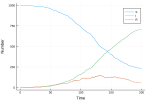

In [8]:
@df sir_out plot(:time, [:S :I :R], xlabel="Time",ylabel="Number")